 24.603057 seconds (182.99 M allocations: 3.854 GiB, 1.12% gc time, 7.77% compilation time: 46% of which was recompilation)
  3.079867 seconds (680.82 k allocations: 47.848 MiB, 0.34% gc time, 15.29% compilation time)


[ Info: Saved animation to D:\OneDrive\public\0050\lln10000.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0050\\lln10000.gif")
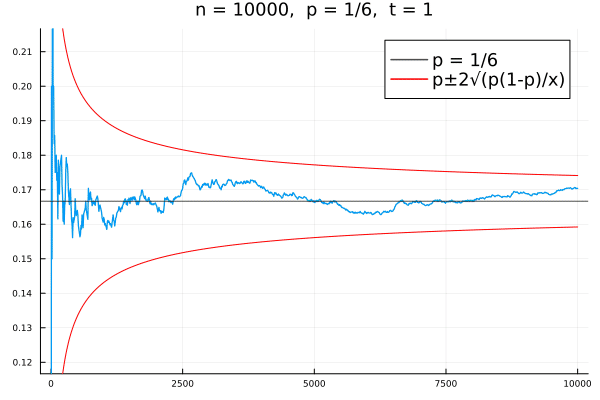

In [1]:
using Distributions
using Random
using StatsPlots
default(fmt=:png, tickfontsize=6, titlefontsize=12, legendfontsize=12)

function plot_paths(paths, t, p; kwargs...)
    n = length(paths[1])
    s = n ÷ 1000
    ns = [1; s:s:n-s; n]
    plot()
    for i in 1:t-5
        path = paths[i]
        plot!(ns, path[ns]; label="", lw=0.3, alpha=0.5)
    end
    for i in max(1, t-4):min(t, length(paths))
        path = paths[i]
        j = i - (t-5)
        plot!(ns, path[ns]; label="", lw=0.3+0.2j, alpha=min(1, 0.3+0.2j))
    end
    plot!(; kwargs...)
end

function gif_lln(; n=10^4, p=1/6, p_str="1/6", niters=100, ylim=(p-0.05, p+0.05), ytick=0:0.01:1, kwargs...)
    paths = [cumsum(rand(Bernoulli(p), n)) ./ (1:n) for _ in 1:niters]
    @time anim = @animate for t in [1:(niters+5); fill(niters+5, 10)]
        plot_paths(paths, t, p; xlim=(-0.02n, 1.02n), ylim)
        hline!([p]; label="p = $p_str", c=:black, alpha=0.7)
        plot!(range(0, n, 1001), x->p+2√(p*(1-p)/x); label="p±2√(p(1-p)/x)", c=:red)
        plot!(range(0, n, 1001), x->p-2√(p*(1-p)/x); label="", c=:red)
        plot!(; ytick, kwargs...)
        title!("n = $n,  p = $p_str,  t = $(min(niters, t))")
    end
    @time gif(anim, "lln$n.gif", fps=5)
end

Random.seed!(4649373)
gif_lln(; n=10^4, p=1/6, p_str="1/6", niters=100, ylim=(1/6-0.05, 1/6+0.05), ytick=0:0.01:1)

 22.671645 seconds (179.57 M allocations: 3.628 GiB, 1.28% gc time)
  2.273207 seconds (659 allocations: 104.844 KiB)


[ Info: Saved animation to D:\OneDrive\public\0050\lln100000.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0050\\lln100000.gif")
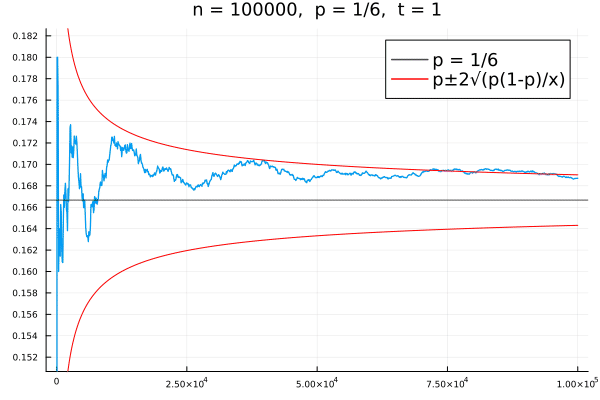

In [2]:
Random.seed!(4649373)
gif_lln(; n=10^5, p=1/6, p_str="1/6", niters=100, ylim=(1/6-0.016, 1/6+0.016), ytick=0:0.002:1)

 23.798880 seconds (179.77 M allocations: 3.623 GiB, 1.94% gc time)
  2.374662 seconds (660 allocations: 104.484 KiB)


[ Info: Saved animation to D:\OneDrive\public\0050\lln1000000.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0050\\lln1000000.gif")
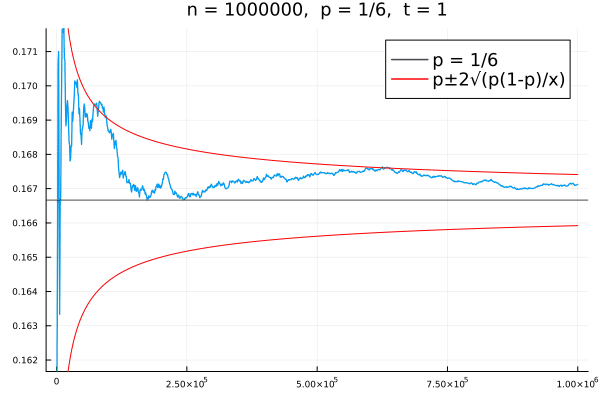

In [3]:
Random.seed!(4649373)
gif_lln(; n=10^6, p=1/6, p_str="1/6", niters=100, ylim=(1/6-0.005, 1/6+0.005), ytick=0:0.001:1)

 24.072183 seconds (179.63 M allocations: 3.638 GiB, 2.00% gc time)
  2.435275 seconds (657 allocations: 104.445 KiB)


[ Info: Saved animation to D:\OneDrive\public\0050\lln10000000.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0050\\lln10000000.gif")
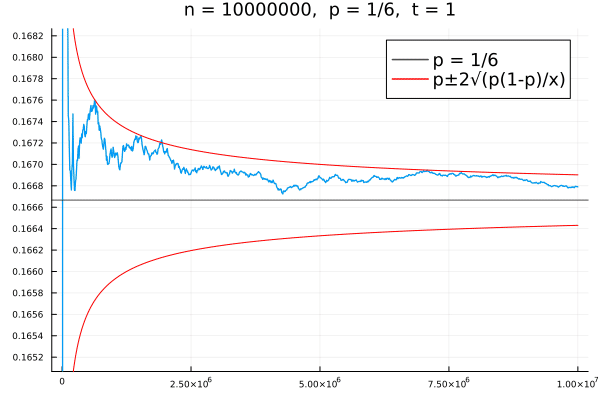

In [4]:
Random.seed!(4649373)
gif_lln(; n=10^7, p=1/6, p_str="1/6", niters=100, ylim=(1/6-0.0016, 1/6+0.0016), ytick=0:0.0002:1)